In [62]:
import sys
sys.path.insert(1, '../..')

import convml_tt
from utils import *

from convml_tt.system import TripletTrainerModel, TripletTrainerDataModule
from convml_tt.data.examples import fetch_example_dataset, ExampleData, fetch_pretrained_model, PretrainedModel
from convml_tt.data.dataset import TileType, ImageSingletDataset
from convml_tt.utils import get_embeddings
import convml_tt.interpretation
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import xarray as xr
import pandas as pd
import pytorch_lightning as pl
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import torch
from sklearn.decomposition import PCA
from PIL import Image
import os, shutil
from matplotlib.patches import Rectangle as rectan
from random import seed
from random import randint
from sklearn.metrics import confusion_matrix
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestCentroid

from convml_tt.interpretation.rectpred.transform import apply_transform
from convml_tt.data.examples import load_pretrained_model, PretrainedModel
from convml_tt.interpretation.rectpred.data import make_sliding_tile_model_predictions
from convml_tt.interpretation.rectpred.plot import make_rgb
from tqdm.notebook import tqdm
import numpy as np

TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
TEST_SIZE = 0.3
RANDOM_STATE = 1024
COLORS = ['b', 'g', 'r', 'm'] # Color of each class
DATASETS_path = "../../../DATASETS/"
print(cv2.__version__)
print(np.__version__)
pca = PCA(n_components=3, svd_solver='arpack')


print("path :"+str(DATASETS_path+'CLUSTERING_BIGGEST_SQUARE/'))

4.5.2
1.21.1
path :../../../DATASETS/CLUSTERING_BIGGEST_SQUARE/


In [5]:
model = TripletTrainerModel.load_from_checkpoint(checkpoint_path="c:/Users/Ray/Documents/Stage/MODELS/zooniverse-model.ckpt")

  0%|                                                                                          | 0/143 [00:00<?, ?it/s]C:\Users\Ray\anaconda3\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
100%|████████████████████████████████████████████████████████████████████████████████| 143/143 [05:00<00:00,  2.10s/it]


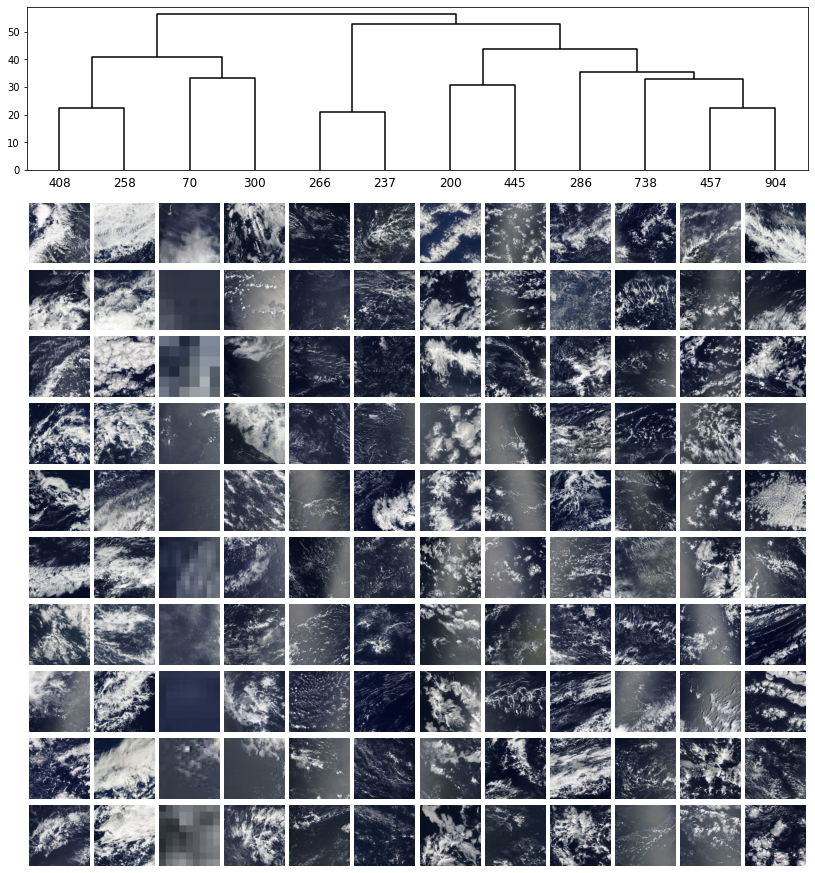

In [6]:

dataset_path =  DATASETS_path+'CLUSTERING_BIGGEST_SQUARE/'
tile_dataset = ImageSingletDataset(data_dir=dataset_path, tile_type=TileType.ANCHOR)
da_embeddings = get_embeddings(tile_dataset=tile_dataset, model=model)
clusters = convml_tt.interpretation.plots.dendrogram(da_embeddings, n_samples=10, n_clusters_max=12, return_clusters=True)#, label_clusters=True)

In [7]:
with open(DATASETS_path+"CLUSTERING_BIGGEST_SQUARE/labels.pickle", "rb") as handle:
    labs = pickle.load(handle)
print(len(labs))
print(len(clusters[1]))

4569
4569


In [8]:
clclc = list(map(int, clusters[1]))
cfs_mat = confusion_matrix(labs, clclc)

(5, 12)
(5,)
(12, 5)


<AxesSubplot:title={'center':'Confusion Matrix Clusters MODIS model % with MAX SQUARE of rectangles.'}>

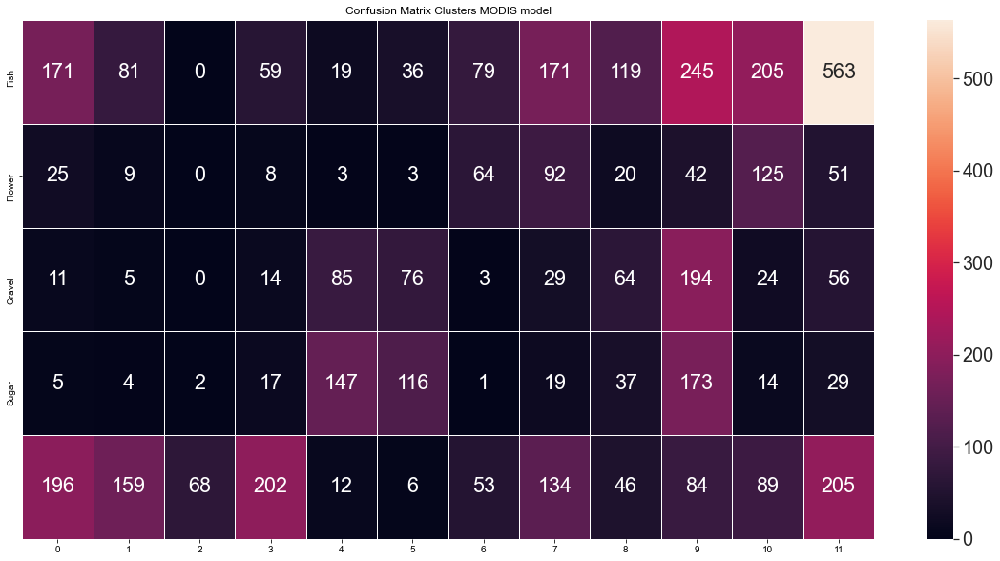

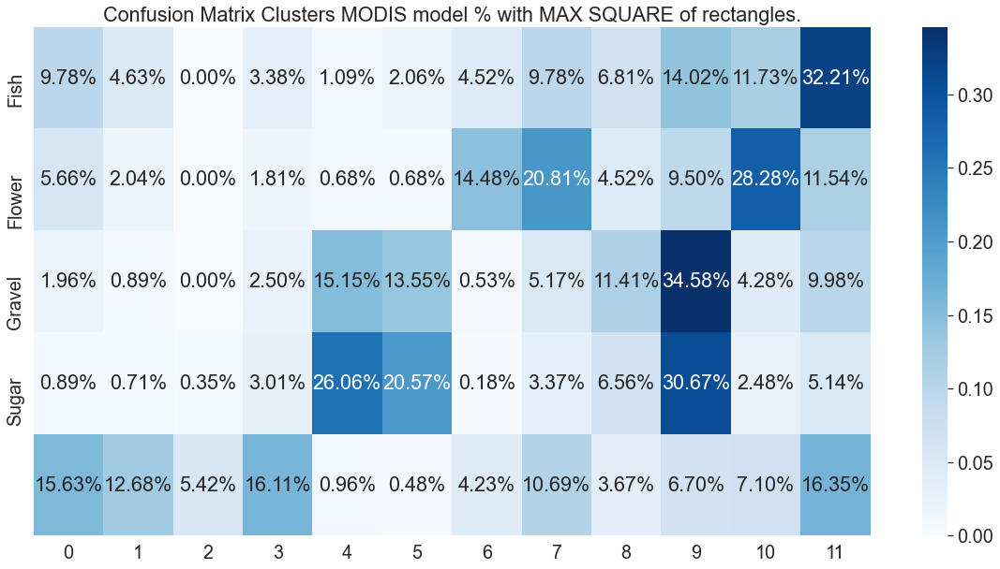

In [9]:

associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Clusters MODIS model")
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:5,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:5,:].shape)
print(   np.sum(  cfs_mat[:5,:], axis=1  ).shape  )
print(   (  cfs_mat[:5,:].T/np.sum(cfs_mat[:5,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Clusters MODIS model % with MAX SQUARE of rectangles.")
sns.heatmap( (cfs_mat[:5,:].T/np.sum(cfs_mat[:5,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [10]:
print(len(da_embeddings))
pca_2d = PCA(n_components=2, svd_solver='arpack')
principalComponents = pca_2d.fit_transform(da_embeddings)
print(principalComponents.shape)

4569
(4569, 2)


(4569,)
[ 0.13369258  0.74887353  0.25619414 ... -0.79870844 -0.7128806
  0.15604098]






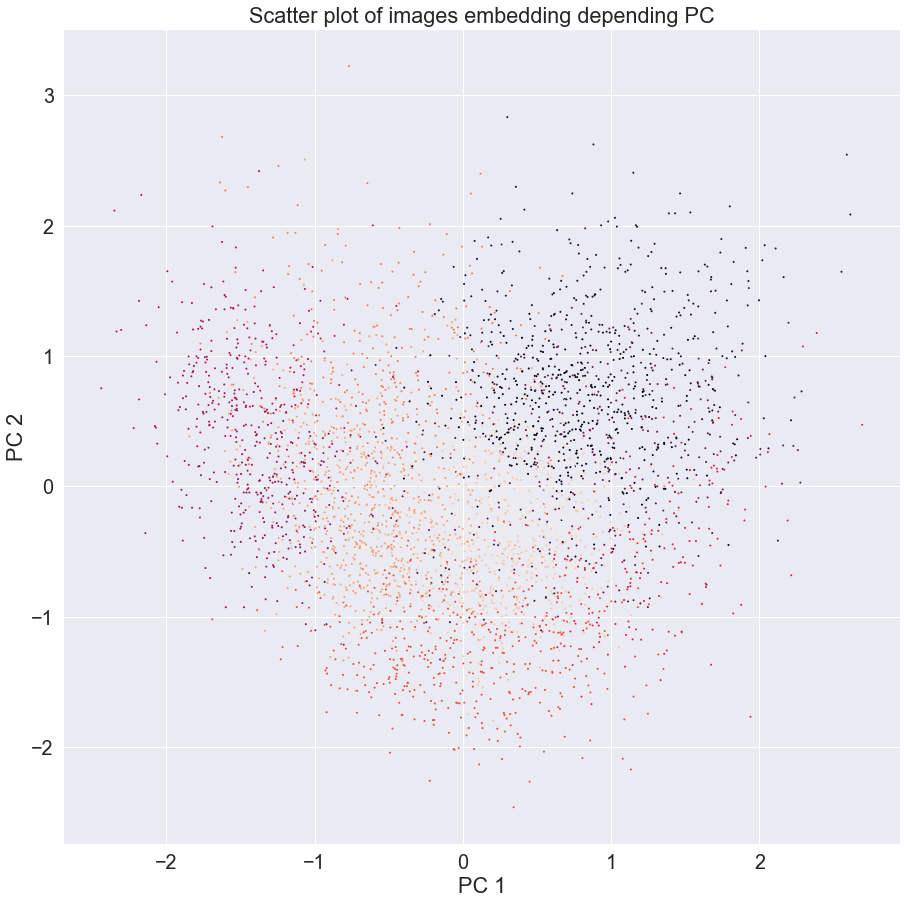

(46,)
[ 0.27938774  0.0787311   0.71287936 -0.06742689  0.7888366  -1.0996667
 -0.695782   -0.45756447  0.09120079  1.4140077   0.07268554  1.3013563
 -1.4514073  -0.83413273 -0.83196723 -0.4788537   0.88470936  0.8497222
 -0.08392609 -0.40212247  0.71246403  0.4500155   0.04924969 -1.0640775
 -1.1200459   0.58150953 -0.44373208 -0.03815885 -1.1964875  -1.354633
  0.05811649 -0.26568148 -0.7766283   0.17353679  1.2308111   0.40317056
  1.5875236  -1.6068897  -1.6961128  -1.7112094  -0.49293843 -0.47238618
 -1.1388172   0.25162157  0.0685202   0.7960926 ]






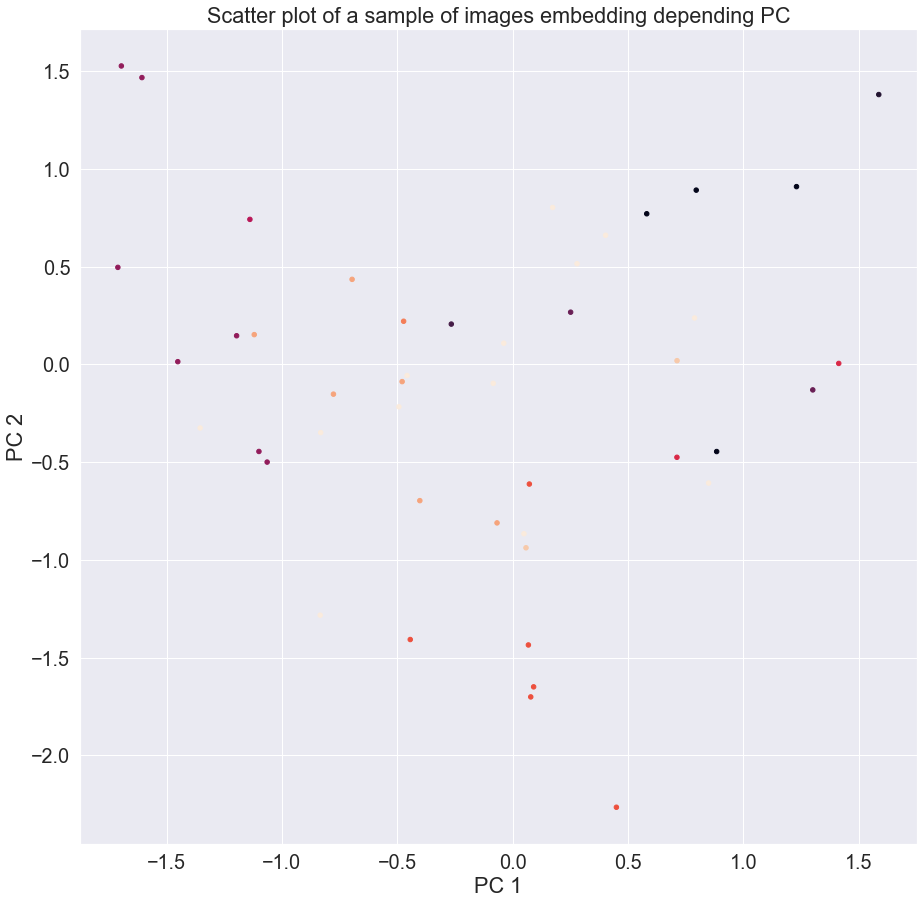

In [11]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( principalComponents, clusters[1], test_size=0.01, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=clusters[1], label=clusters[1], s=1)
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
#plt.legend(handles=scatter.legend_elements()[0], labels=clusters[1])
plt.show()

print(X_test[:, 0].shape)
print(X_test[:, 0])
print("\n\n\n")
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, label=y_test, s=20)
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
#plt.legend(handles=scatter.legend_elements()[0], labels=y_test)
plt.show()

(4569,)
[ 0.13369258  0.74887353  0.25619414 ... -0.79870844 -0.7128806
  0.15604098]






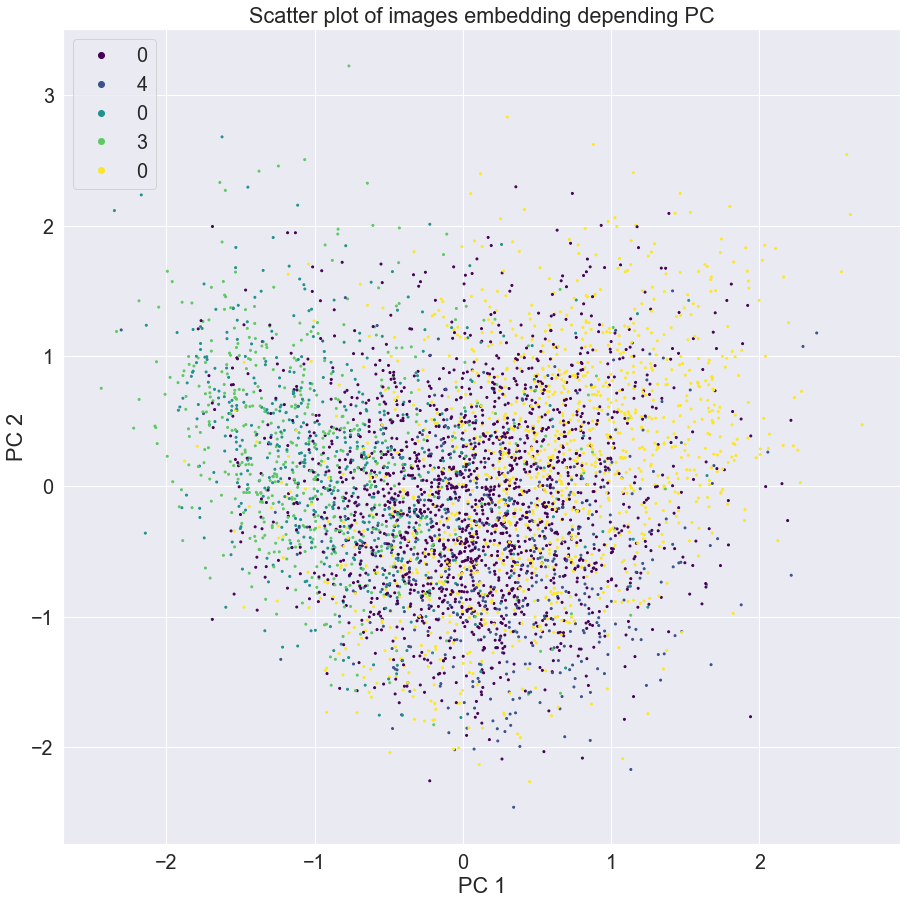

(457,)
[ 2.7938774e-01  7.8731097e-02  7.1287936e-01 -6.7426890e-02
  7.8883660e-01 -1.0996667e+00 -6.9578201e-01 -4.5756447e-01
  9.1200791e-02  1.4140077e+00  7.2685540e-02  1.3013563e+00
 -1.4514073e+00 -8.3413273e-01 -8.3196723e-01 -4.7885370e-01
  8.8470936e-01  8.4972221e-01 -8.3926089e-02 -4.0212247e-01
  7.1246403e-01  4.5001549e-01  4.9249690e-02 -1.0640775e+00
 -1.1200459e+00  5.8150953e-01 -4.4373208e-01 -3.8158845e-02
 -1.1964875e+00 -1.3546330e+00  5.8116492e-02 -2.6568148e-01
 -7.7662832e-01  1.7353679e-01  1.2308111e+00  4.0317056e-01
  1.5875236e+00 -1.6068897e+00 -1.6961128e+00 -1.7112094e+00
 -4.9293843e-01 -4.7238618e-01 -1.1388172e+00  2.5162157e-01
  6.8520196e-02  7.9609263e-01  1.0700678e+00 -4.4101727e-01
 -3.8128170e-01 -9.0777761e-01  1.2285165e+00  1.6797315e-02
  1.4649367e+00 -1.5084418e+00 -5.3625208e-01  1.8768920e+00
  1.1374687e+00 -2.3081231e-01  1.0759387e+00  2.4608046e-01
 -1.6082814e-01  2.2812121e-01 -4.4470616e-02  2.6076424e-01
 -7.5338608e-01 -

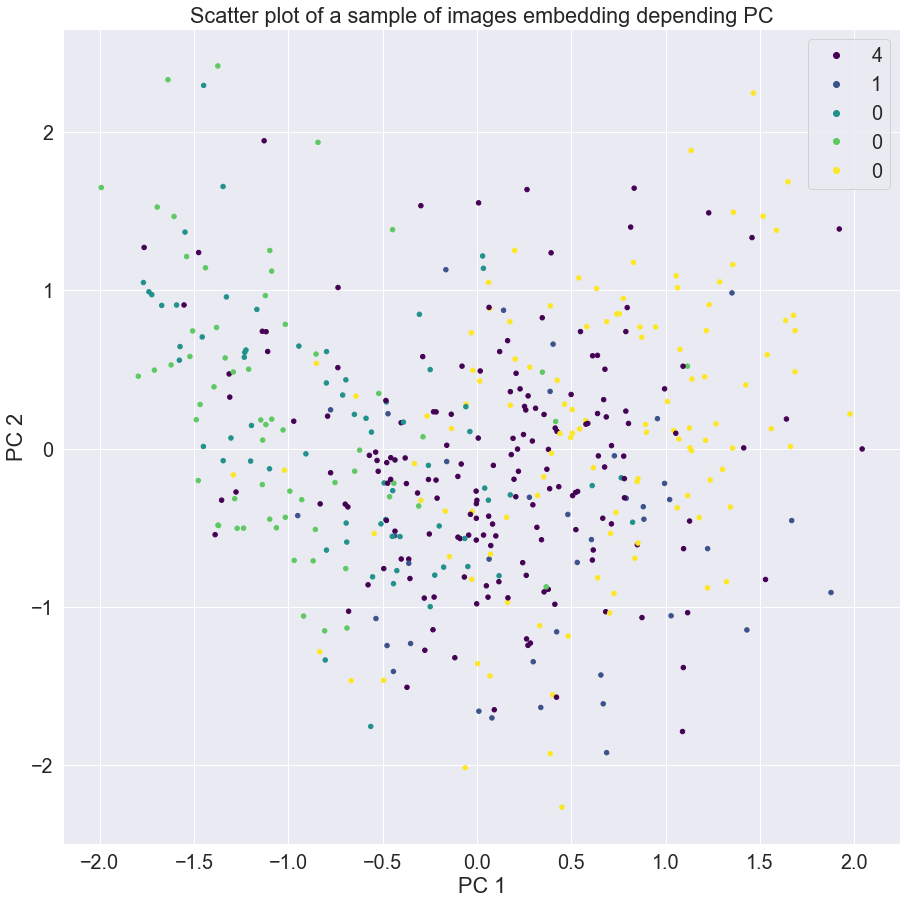

In [12]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( principalComponents, labs, test_size=0.1, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))


scatter = ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=labs, label=labs, s=4, cmap="viridis")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.legend(handles=scatter.legend_elements()[0], labels=labs)
plt.show()




fig, ax = plt.subplots(figsize=(15,15))
for classe in list(set(labs)):
        
    sns.kdeplot(data=tips, x="total_bill", ax=ax, bw_adjust=.2)
plt.title('Scatter plot of images embedding depending PC')
plt.show()






print(X_test[:, 0].shape)
print(X_test[:, 0])
print("\n\n\n")
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, label=y_test, s=20, cmap="viridis")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.legend(handles=scatter.legend_elements()[0], labels=y_test)
plt.show()

# Scatter to separe class 4 from the rest

(4569,)
[ 0.13369258  0.74887353  0.25619414 ... -0.79870844 -0.7128806
  0.15604098]




principal component shape : (4569, 2)
type 1 shape : (1254, 2)


CHAP  1 : [ 0.74887353  0.27988622  1.18662226 ... -0.02844931  0.99465966
  0.15604098]


CHAP  2 : [ 0.20137759 -1.75330746  1.1571902  ... -0.82518506 -0.3321034
 -0.43354118]


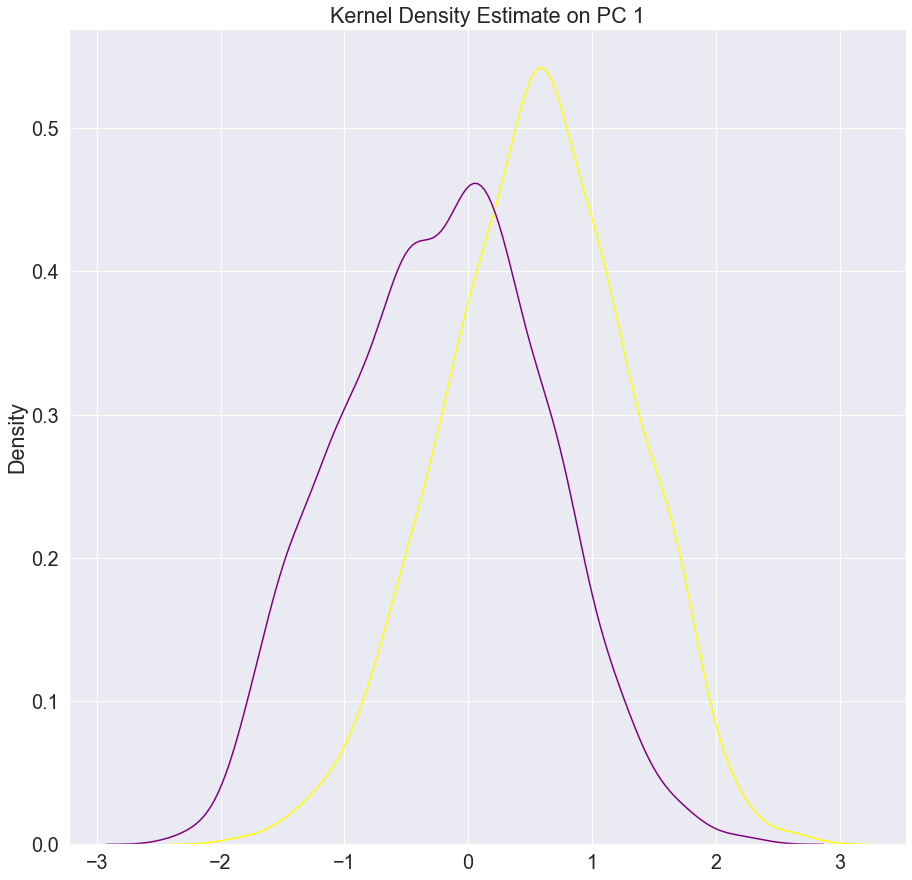

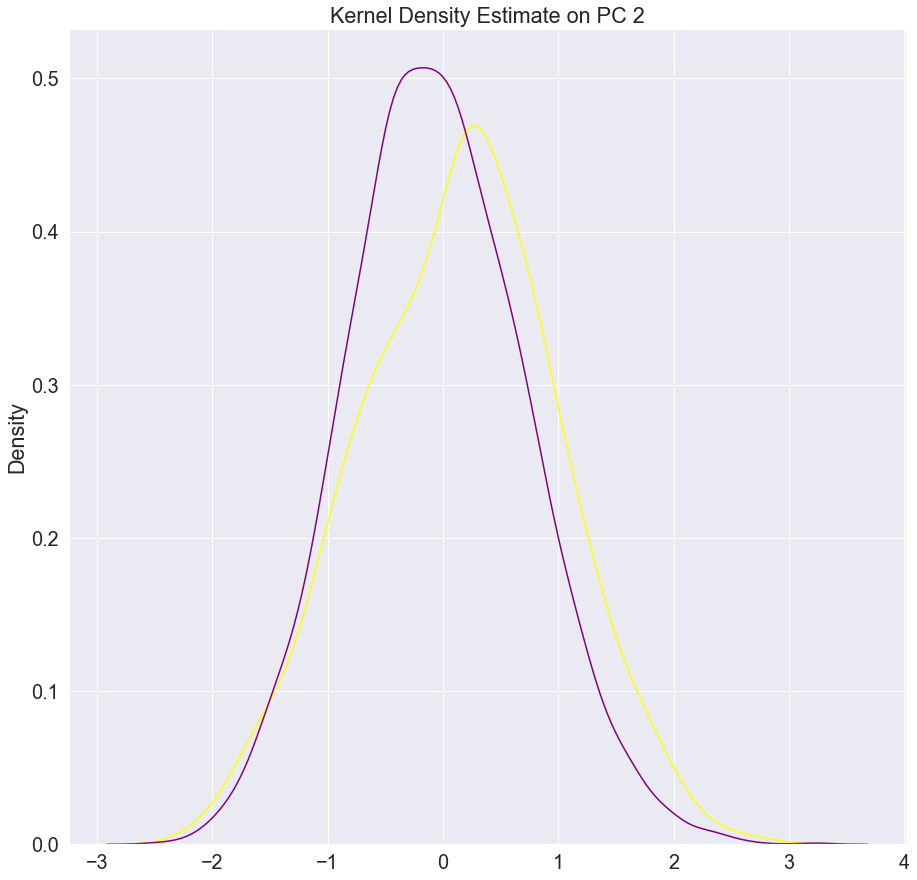

C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Ray\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


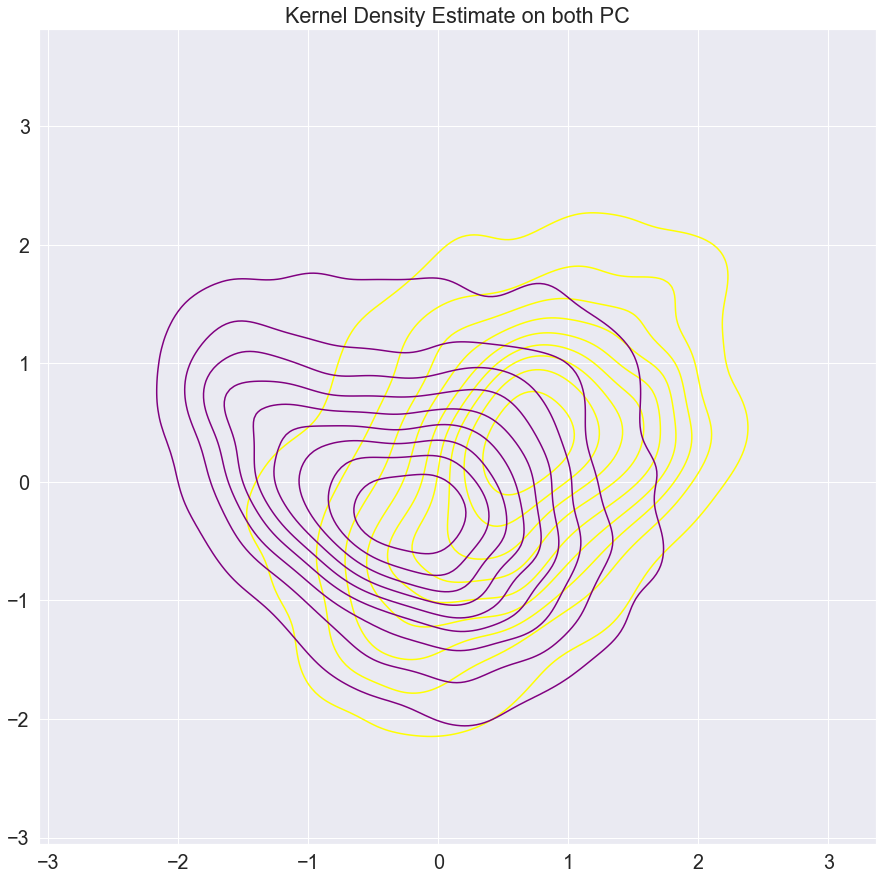

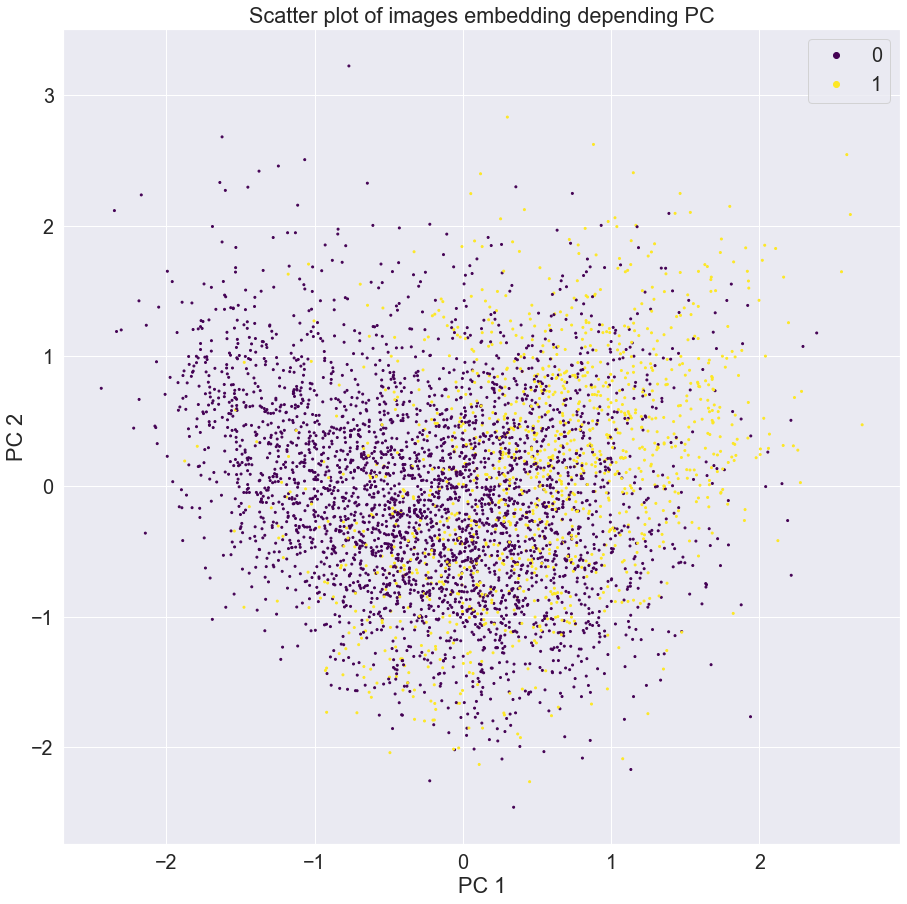

(457,)
[ 2.7938774e-01  7.8731097e-02  7.1287936e-01 -6.7426890e-02
  7.8883660e-01 -1.0996667e+00 -6.9578201e-01 -4.5756447e-01
  9.1200791e-02  1.4140077e+00  7.2685540e-02  1.3013563e+00
 -1.4514073e+00 -8.3413273e-01 -8.3196723e-01 -4.7885370e-01
  8.8470936e-01  8.4972221e-01 -8.3926089e-02 -4.0212247e-01
  7.1246403e-01  4.5001549e-01  4.9249690e-02 -1.0640775e+00
 -1.1200459e+00  5.8150953e-01 -4.4373208e-01 -3.8158845e-02
 -1.1964875e+00 -1.3546330e+00  5.8116492e-02 -2.6568148e-01
 -7.7662832e-01  1.7353679e-01  1.2308111e+00  4.0317056e-01
  1.5875236e+00 -1.6068897e+00 -1.6961128e+00 -1.7112094e+00
 -4.9293843e-01 -4.7238618e-01 -1.1388172e+00  2.5162157e-01
  6.8520196e-02  7.9609263e-01  1.0700678e+00 -4.4101727e-01
 -3.8128170e-01 -9.0777761e-01  1.2285165e+00  1.6797315e-02
  1.4649367e+00 -1.5084418e+00 -5.3625208e-01  1.8768920e+00
  1.1374687e+00 -2.3081231e-01  1.0759387e+00  2.4608046e-01
 -1.6082814e-01  2.2812121e-01 -4.4470616e-02  2.6076424e-01
 -7.5338608e-01 -

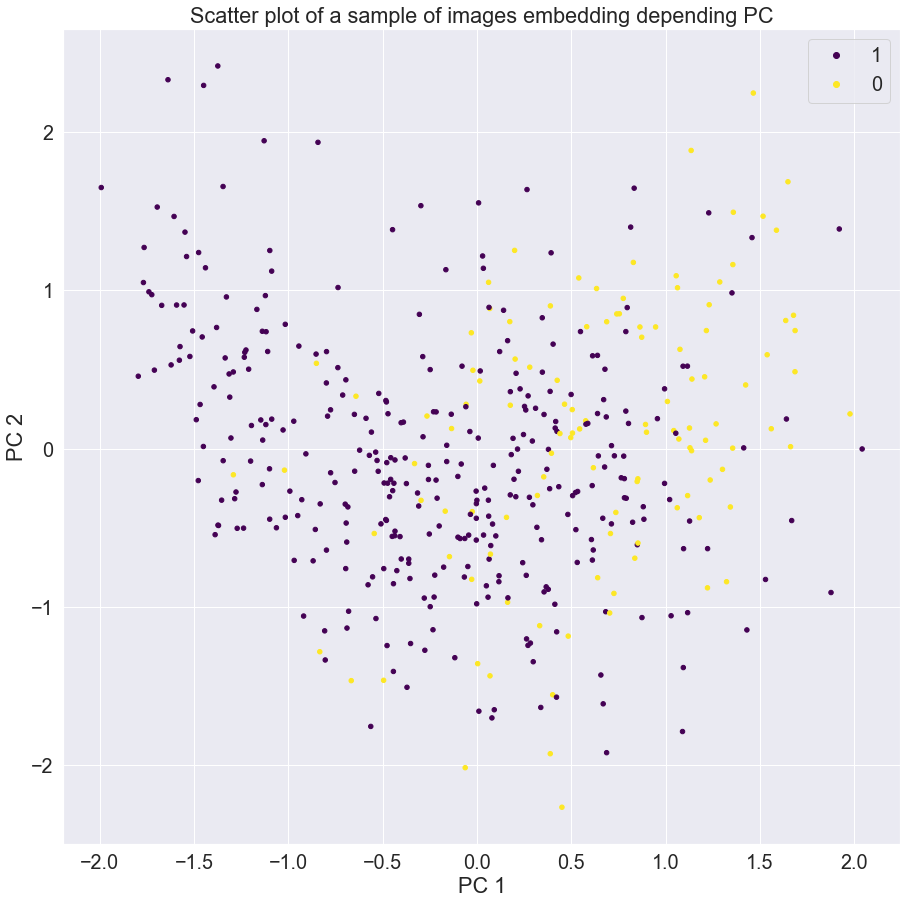

In [61]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")
labs_tmp = []
type1 = []
type2 = []
cnt = 0
for i in labs:
    if i == 4:
        labs_tmp.append(1)
        type1.append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
    else:
        labs_tmp.append(0)
        type2.append([principalComponents[cnt, 0], principalComponents[cnt, 1]])
    cnt += 1
type1 = np.array(type1).astype('float64')
type2 = np.array(type2).astype('float64')
        
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( principalComponents, labs_tmp, test_size=0.1, random_state=42)





"""
data1 = pd.DataFrame({"data": data.ravel(),
                               "column": np.repeat(np.arange(data.shape[0]), data.shape[1])

"""
print("principal component shape : "+str(principalComponents.shape))
print("type 1 shape : "+str(type1.shape))

print("\n\nCHAP  1 : "+str(type1[:,0]))
print("\n\nCHAP  2 : "+str(type1[:,1]))

#print("\n\nCHAP  3 : "+str(np.mean(type2[:,0])) )
#print("\n\nCHAP  4 : "+str(np.mean(type2[:,1])))    


fig, ax = plt.subplots(figsize=(15,15))
sns.kdeplot(type1[:,0], color="yellow") #, type1[:,1])
sns.kdeplot(type2[:,0], color="purple") #, type2[:,1])

plt.title('Kernel Density Estimate on PC 1')
plt.show()


fig, ax = plt.subplots(figsize=(15,15))
sns.kdeplot(type1[:,1], color="yellow") #, type1[:,1])
sns.kdeplot(type2[:,1], color="purple") #, type2[:,1])

plt.title('Kernel Density Estimate on PC 2')
plt.show()

fig, ax = plt.subplots(figsize=(15,15))
sns.kdeplot(type1[:,0], type1[:,1], color="yellow") #, type1[:,1])
sns.kdeplot(type2[:,0], type2[:,1], color="purple") #, type2[:,1])

plt.title('Kernel Density Estimate on both PC')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))


scatter =ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=labs_tmp, label=labs_tmp, s=4, cmap="viridis")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.legend(handles=scatter.legend_elements()[0], labels=labs_tmp)
plt.show()

print(X_test[:, 0].shape)
print(X_test[:, 0])
print("\n\n\n")
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, label=y_test, s=20, cmap="viridis")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.legend(handles=scatter.legend_elements()[0], labels=y_test)
plt.show()

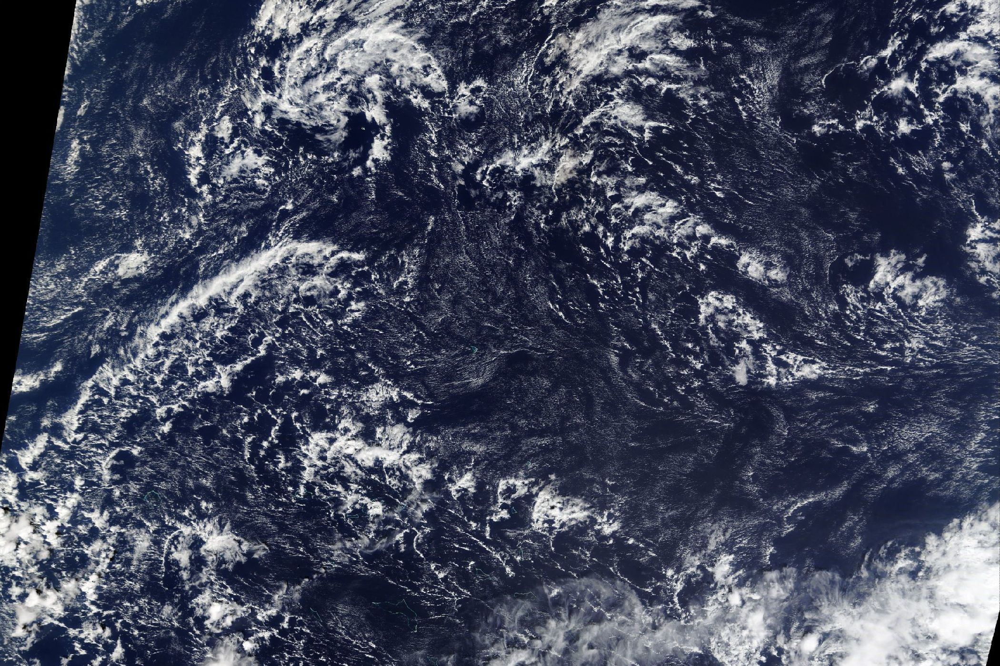

In [14]:
img = Image.open(DATASETS_path+"zooniverse_kaggle/train_images/2d9da73.jpg")
img

In [15]:
da_emb = make_sliding_tile_model_predictions(img=img, model=model, step=(100, 100))

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:14<00:00,  1.82s/it]


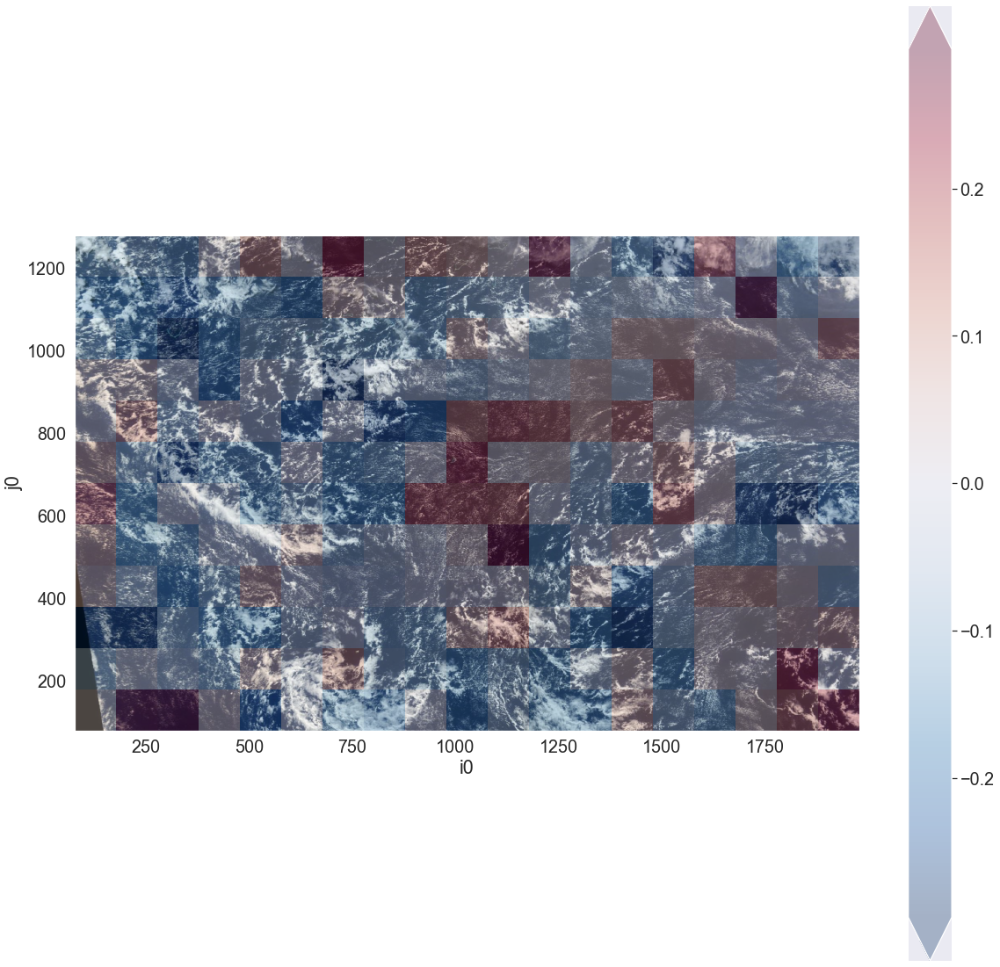

In [16]:
r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(img)
da_emb.isel(emb_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

C:\Users\Ray\anaconda3\lib\site-packages\xarray\core\dataarray.py:745: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data


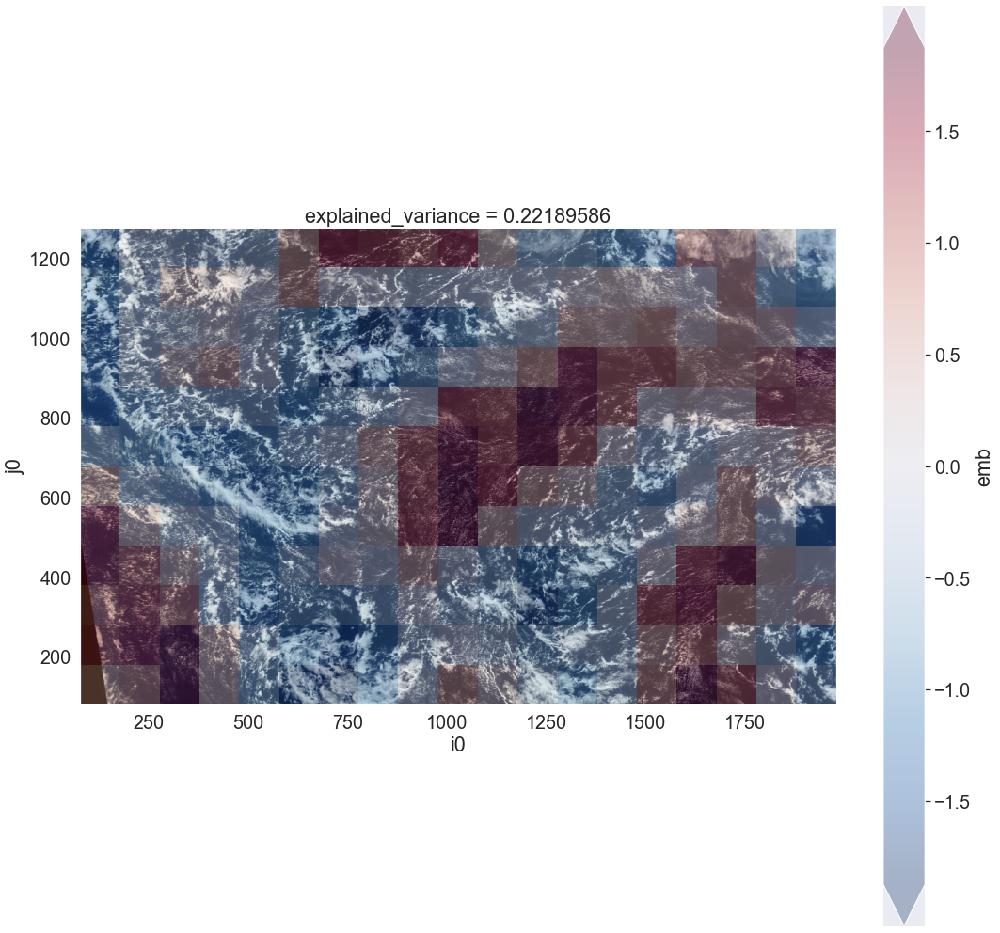

In [17]:
da_emb_pca = apply_transform(da_emb, "pca")

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

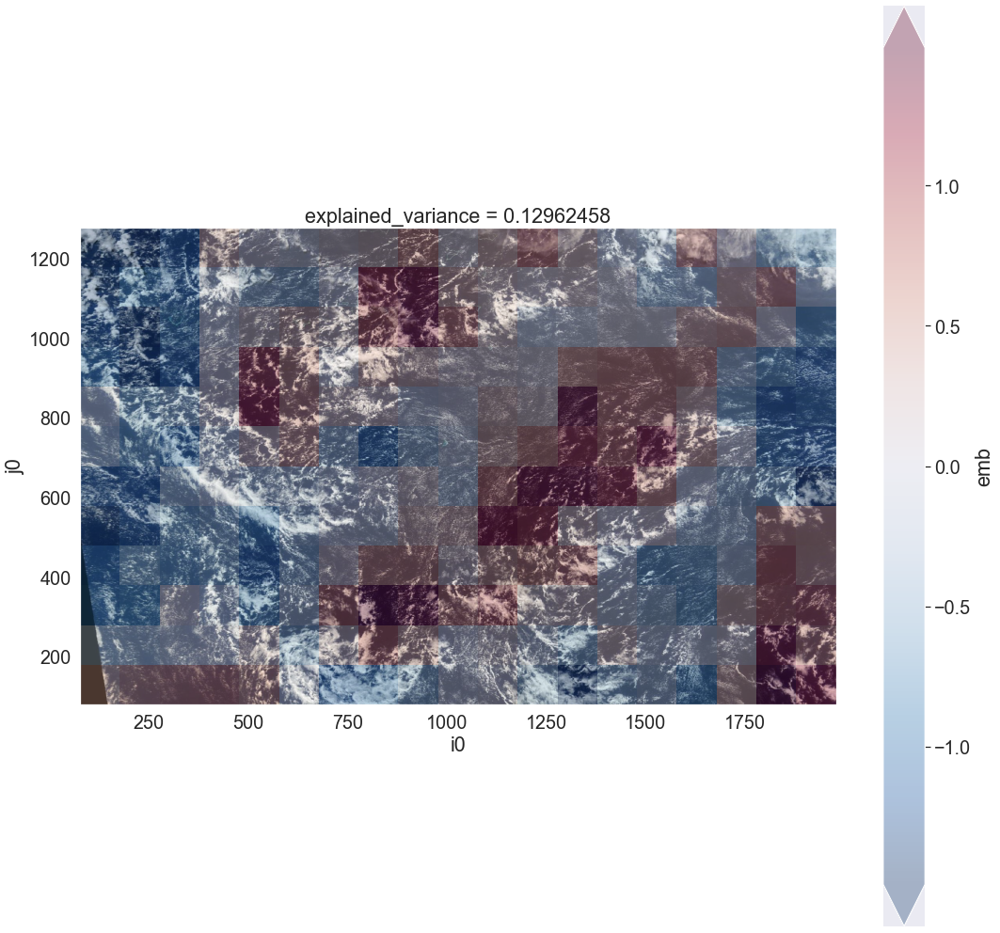

In [18]:
# looking at the second PCA component

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=1).plot(ax=ax, y="j0", alpha=0.3, robust=True)

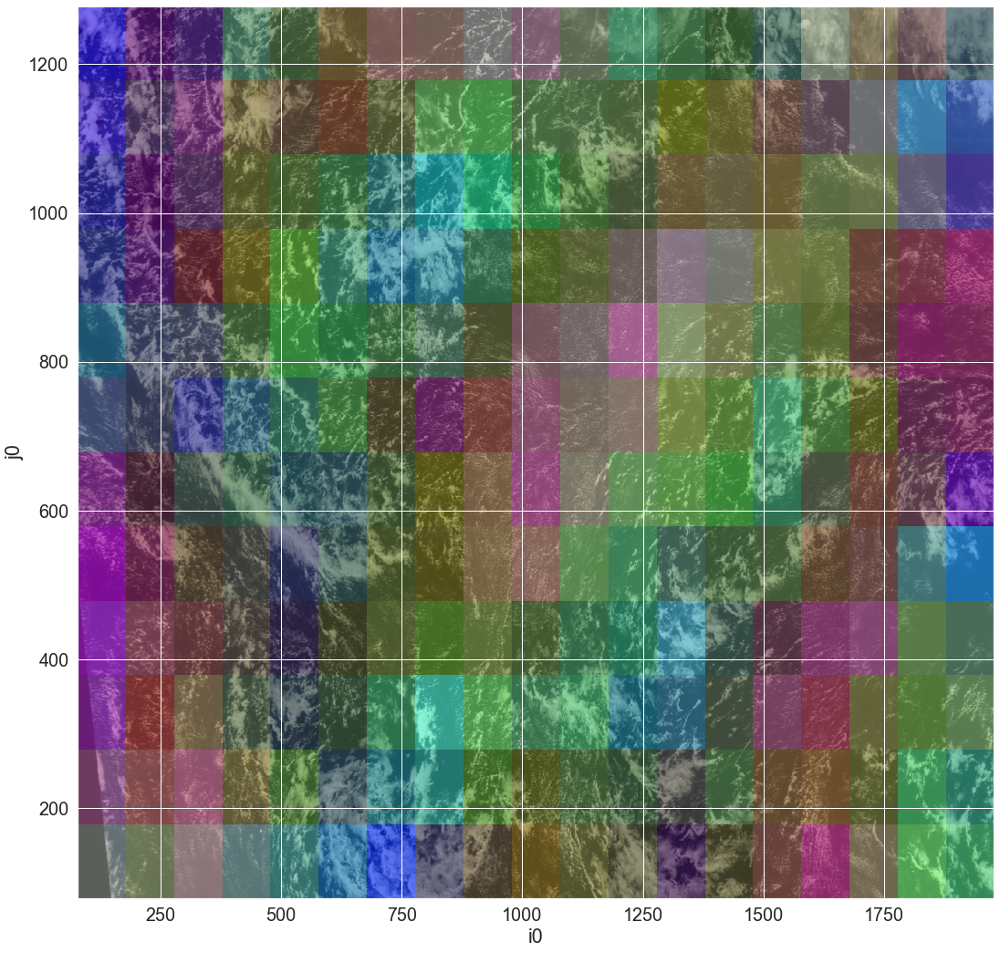

In [19]:
da_rgba = make_rgb(da_emb_pca, pca_dim=[0,1,2], alpha=0.6)
r_aspect = img.size[0] / img.size[1]
fig, ax = plt.subplots(figsize=(18 ,18))
ax.imshow(img)
da_rgba.plot.imshow(rgb="rgba", y="j0", ax=ax)

(4569,)
[ 0.13369258  0.74887353  0.25619414 ... -0.79870844 -0.7128806
  0.15604098]






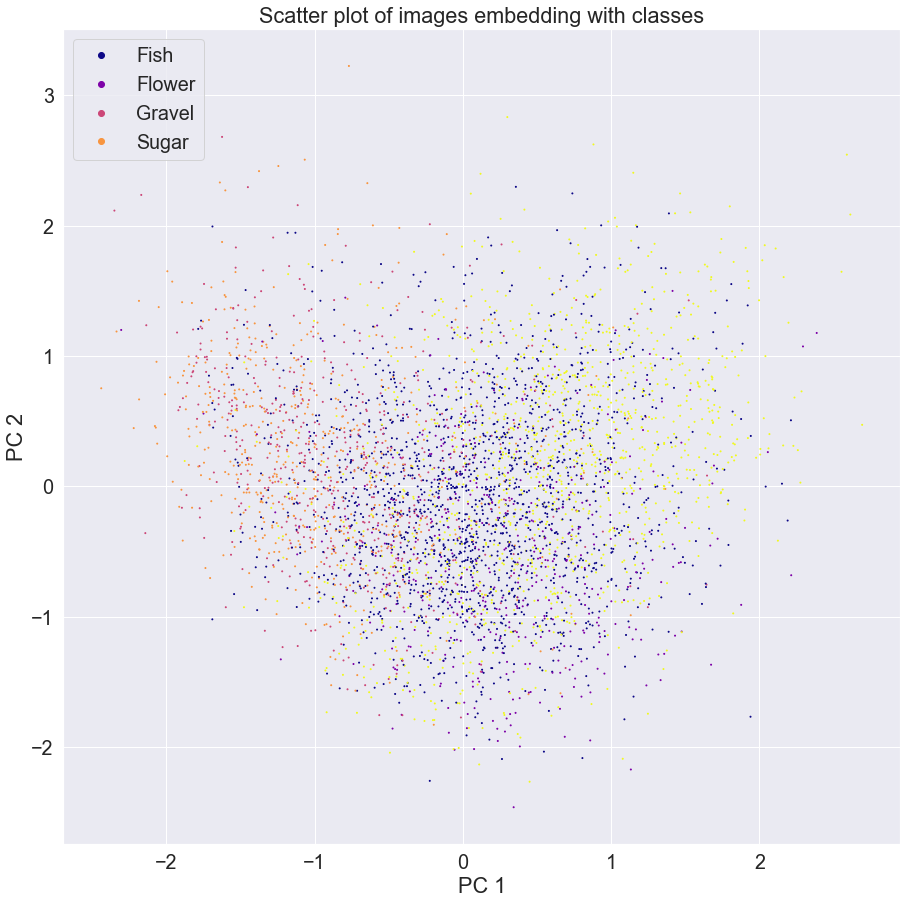

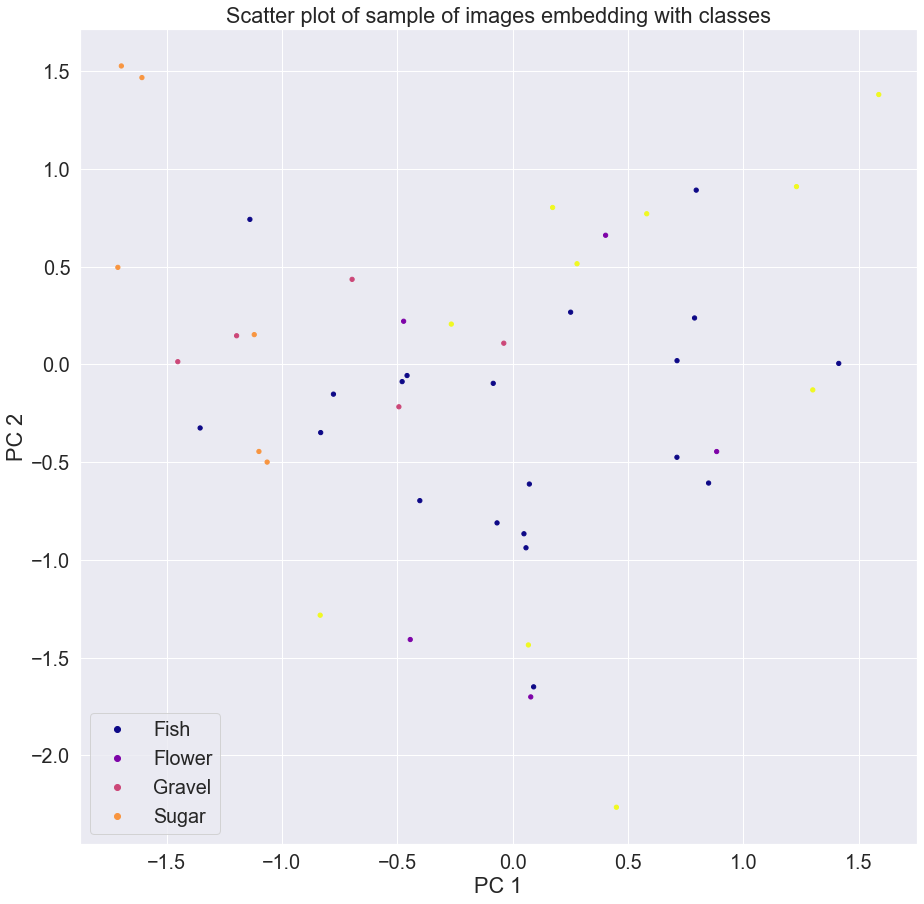

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Centroids : 
[[ 0.08177881 -0.08656723]
 [ 0.31088951 -0.54421234]
 [-0.76711321  0.15676382]
 [-0.9671396   0.23801266]
 [ 0.55458915  0.13530912]]
Shape : (5, 2)


ValueError: 'c' argument has 4 elements, which is inconsistent with 'x' and 'y' with size 5.

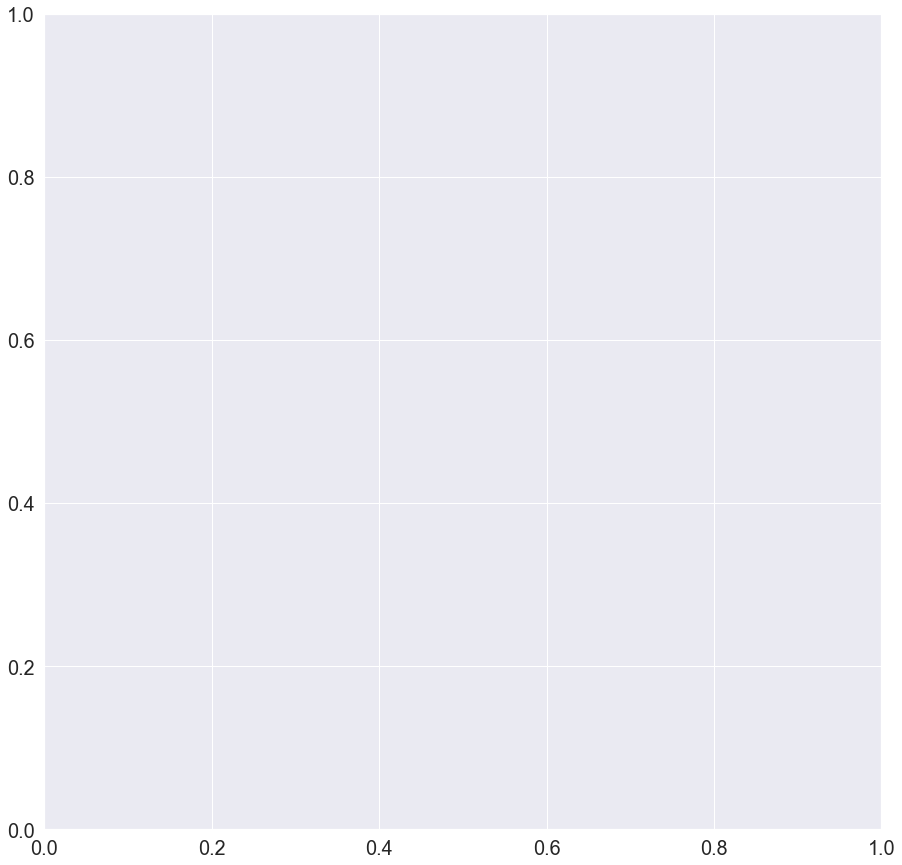

In [20]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")

labs_np = np.array(labs)
X_train, X_test, y_train, y_test = train_test_split( principalComponents, labs, test_size=0.01, random_state=42)




fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=labs, s=1 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=18 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of sample of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()





clf = NearestCentroid()
clf.fit(principalComponents, labs)
fig, ax = plt.subplots(figsize=(15,15))
print("Centroids : ")
print(clf.centroids_)
print("Shape : "+str(clf.centroids_.shape))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], c=[0, 1, 2, 3], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

